In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp -r "/content/drive/MyDrive/TunisianProductsImages" ./
!cp "/content/drive/MyDrive/DetectionYolo.pt" ./

In [ ]:
!export HF_TOKEN=""
!huggingface-cli login

⚠️  Warning: 'huggingface-cli login' is deprecated. Use 'hf auth login' instead.

    _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
    _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
    _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
    _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
    _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|

    To log in, `huggingface_hub` requires a token generated from https://huggingface.co/settings/tokens .
Enter your token (input will not be visible): 
Add token as git credential? (Y/n) n
Token is valid (permission: read).
The token `NvidiaTokenAcces` has been saved to /root/.cache/huggingface/stored_tokens
Your token has been saved to /root/

In [ ]:
!pip install qwen-vl-utils
!pip install -U transformers # transformers==4.47.1
!pip install flash-attn
!pip install -U flash-attn
!pip install -U ultralytics
!pip install python-doctr
# or with preinstalled packages for visualization & html & contrib module support
!pip install "python-doctr[viz,html,contrib]"
!pip install pytesseract
!pip install json5

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.5/40.5 MB 54.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 96.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for flash-attn: filename=flash_attn-2.8.3-cp312-cp312-linux_x86_64.whl size=256040057 sha256=f25da18657a87fc83dc1bfb8b7751b82246e9db355510226b674fd437c34b5fb
  Stored in directory: /root/.cache/pip/wheels/3d/59/46/f282c12c73dd4bb3c2e3fe199f1a0d0f8cec06df0cccfeee27
Successfully built flash-attn
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 55.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.5/48.5 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 60.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 288.4/288.4 kB 25.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.1/345.1 kB 32.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/

In [ ]:
from transformers import Qwen2VLForConditionalGeneration, AutoTokenizer, AutoProcessor
from qwen_vl_utils import process_vision_info
import torch

model = Qwen2VLForConditionalGeneration.from_pretrained(
     "Qwen/Qwen2-VL-7B-Instruct",
     dtype=torch.bfloat16,
     attn_implementation="flash_attention_2",
     device_map="auto",
 )

# default processer
processor = AutoProcessor.from_pretrained("Qwen/Qwen2-VL-7B-Instruct")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

model.safetensors.index.json: 0.00B [00:00, ?B/s]

Fetching 5 files:   0%|          | 0/5 [00:00<?, ?it/s]

model-00003-of-00005.safetensors:   0%|          | 0.00/3.86G [00:00<?, ?B/s]

model-00004-of-00005.safetensors:   0%|          | 0.00/3.86G [00:00<?, ?B/s]

model-00002-of-00005.safetensors:   0%|          | 0.00/3.86G [00:00<?, ?B/s]

model-00005-of-00005.safetensors:   0%|          | 0.00/1.09G [00:00<?, ?B/s]

model-00001-of-00005.safetensors:   0%|          | 0.00/3.90G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/5 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/244 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/347 [00:00<?, ?B/s]

The image processor of type `Qwen2VLImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. Note that this behavior will be extended to all models in a future release.


tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

chat_template.json: 0.00B [00:00, ?B/s]

In [ ]:
import cv2
import numpy as np
from PIL import Image

import pytesseract
cv2 = cv2  # remove ambiguity


def detect_rotation_angle(pil_img):
    osd = pytesseract.image_to_osd(pil_img)
    # Parse the rotation angle
    for line in osd.split("\n"):
        if "Rotate:" in line:
            angle = int(line.split(":")[-1].strip())
            return angle
    return 0  # default if not detected



def order_points(pts):
    rect = np.zeros((4, 2), dtype="float32")
    s = pts.sum(axis=1)
    diff = np.diff(pts, axis=1)

    rect[0] = pts[np.argmin(s)]    # top-left
    rect[2] = pts[np.argmax(s)]    # bottom-right
    rect[1] = pts[np.argmin(diff)] # top-right
    rect[3] = pts[np.argmax(diff)] # bottom-left

    return rect


def deskew(image):
    """Deskew image with proper canvas expansion to prevent cropping."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray_inv = cv2.bitwise_not(gray)

    # Otsu threshold on inverted image to find text
    thresh = cv2.threshold(gray_inv, 0, 255,
                           cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]

    # Find all non-zero points
    coords = np.column_stack(np.where(thresh > 0))
    if len(coords) < 10:
        return image  # not enough points

    # Compute minimum area rotated rectangle
    rect = cv2.minAreaRect(coords)
    angle = rect[-1]

    # Standardize angle
    if angle < -45:
        angle = 90 + angle
    else:
        angle = -angle  # Note: negative for clockwise correction

    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)

    # Get rotation matrix
    M = cv2.getRotationMatrix2D(center, angle, 1.0)

    # Compute new bounding dimensions after rotation
    cos = np.abs(M[0, 0])
    sin = np.abs(M[0, 1])

    new_w = int((h * sin) + (w * cos))
    new_h = int((h * cos) + (w * sin))

    # Adjust the rotation matrix to account for translation
    M[0, 2] += (new_w / 2) - center[0]
    M[1, 2] += (new_h / 2) - center[1]

    # Perform the rotation on expanded canvas
    rotated = cv2.warpAffine(
        image, M, (new_w, new_h),
        flags=cv2.INTER_CUBIC,
        borderMode=cv2.BORDER_REPLICATE  # or BORDER_CONSTANT with background color
    )

    return rotated

def detect_and_warp(orig_img, conf_thresh=0.4):
    # --- ensure numpy array ---
    if isinstance(orig_img, Image.Image):
        orig_img = np.array(orig_img)

    if "torch" in str(type(orig_img)):
        orig_img = orig_img.detach().cpu().numpy()
        if orig_img.ndim == 3 and orig_img.shape[0] in [1, 3]:
            orig_img = np.transpose(orig_img, (1, 2, 0))

    orig_img = orig_img.astype(np.uint8)

    # --- YOLO detection ---
    results = model_yolo(orig_img)

    if len(results[0].boxes) == 0:
        raise ValueError("No objects detected.")

    box = results[0].boxes.xyxy[0].cpu().numpy()
    x1, y1, x2, y2 = box

    corners = np.array([
        [x1, y1],
        [x2, y1],
        [x2, y2],
        [x1, y2]
    ], dtype="float32")

    corners = order_points(corners)

    # --- perspective transform ---
    tl, tr, br, bl = corners

    maxWidth = int(max(np.linalg.norm(br - bl), np.linalg.norm(tr - tl)))
    maxHeight = int(max(np.linalg.norm(tr - br), np.linalg.norm(tl - bl)))

    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]
    ], dtype="float32")

    M = cv2.getPerspectiveTransform(corners, dst)
    warped = cv2.warpPerspective(orig_img, M, (maxWidth, maxHeight))
    # --- deskew BEFORE threshold ---
    warped = deskew(warped)

    # --- denoise + blur ---
    gray = cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY)

    thresh_rgb = cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)

    return thresh_rgb


In [ ]:
from doctr.models import ocr_predictor
from doctr.io import DocumentFile
from PIL import Image
import numpy as np


model_2 = ocr_predictor(det_arch='db_resnet50', reco_arch='parseq', pretrained=True)


# Function to detect rotation angle using Tesseract OSD
# Open the image file into a PIL Image object
input_image_pil = Image.open("/content/TunisianProductsImages/20251107_202413.jpg")


def predict_ocr(path):
  # Optional preprocessing / deskew / warp
  input_image_pil = Image.open(path)

  display_img(input_image_pil)
  processed_image_array = detect_and_warp(input_image_pil)
  if isinstance(processed_image_array, list):
      image_array = processed_image_array[0]
  else:
      image_array = processed_image_array

  # Ensure proper dtype
  if image_array.dtype != np.uint8:
      image_array = image_array.astype(np.uint8)

  # Convert to PIL Image
  processed_image_pil = Image.fromarray(image_array)

  # Detect rotation angle and rotate if needed
  angle = detect_rotation_angle(processed_image_pil)
  if angle != 0:
      processed_image_pil = processed_image_pil.rotate(-angle, expand=True)

  display_img(processed_image_pil)

  # Save the corrected image
  processed_image_pil.save("/content/output_image.png")

  # Run Doctr OCR
  single_img_doc = DocumentFile.from_images("/content/output_image.png")
  result = model_2(single_img_doc)


  #res = ocr_page_with_nanonets_s(processed_image_pil)
  #print(res)
  # Show OCR results
  return result


  0%|          | 0/102021912 [00:00<?, ?it/s]

  0%|          | 0/95457349 [00:00<?, ?it/s]

In [ ]:
res = predict_ocr("/content/TunisianProductsImages/20251107_202413.jpg")

json_output = res.export()

NameError: name 'predict_ocr' is not defined

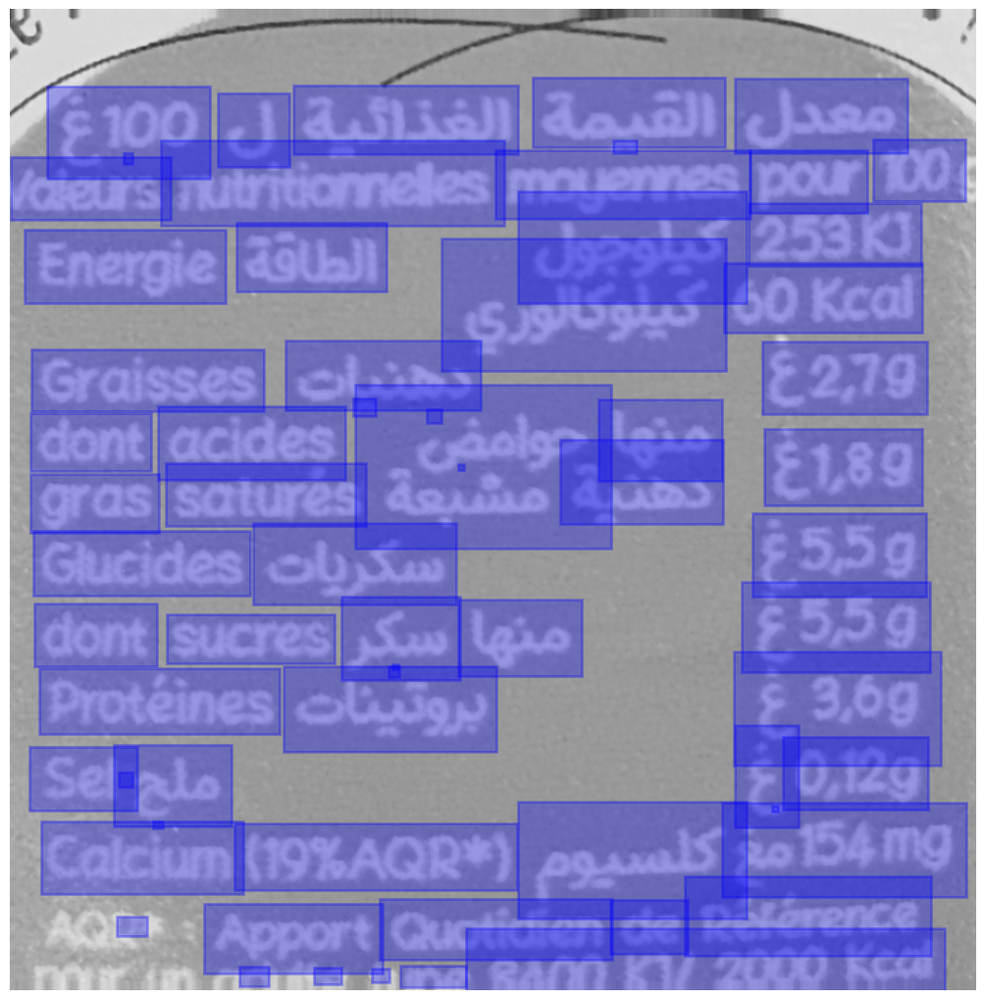

In [ ]:
res.show()

In [ ]:
import torch
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image
model_yolo = YOLO("/content/DetectionYolo.pt")

def get_cropped_detection(image_path):
  img = Image.open(image_path)
  results = model_yolo(img)
  cropped_images = []
  for result in results:
    for box in result.boxes:
      cropped_images.append(img.crop(box.xyxy.tolist()[0]))
  return cropped_images


def display_img(img):
  plt.figure()
  plt.imshow(img, cmap='gray')
  plt.show()


In [ ]:
from PIL import Image


def extarct_text_qwen2(image):
  messages = [
    {
      "role": "user",
      "content": [
        { "type": "image", "image": image },
   {
  "type": "text",
  "text": "Extract ONLY the four main nutrition values from the image.\n\nThe label almost always has multiple columns (per 100g, per 100ml, per serving, etc.).\nYou MUST choose values from ONE column only, following this strict priority:\n1. per 100 g / pour 100 g / لكل 100 جم / 100g / 100 g\n2. per 100 ml / pour 100 ml / لكل 100 مل / 100ml / 100 ml\n3. any serving/portion column (only if the above don’t exist)\n\nAlso capture exactly how the chosen column is written (e.g. \"per 100g\", \"pour 100 g\", \"لكل 100جم\", \"Per portion (30g)\", \"per 100 ml\", etc.).\n\nNormalized nutrients (match any language/variation):\n- Calories: kcal, calories, energy, énergie, الطاقة, valeur énergétique, Cal\n- Protein: protéines, protéine, prot, البروتين, بروتين\n- Carbohydrates: glucides, carbohydrates, carbs, الكربوهيدرات, السكريات, glucides totaux\n- Fat: lipides, lipids, matières grasses, fat, total fat, الدهون, الدهنيات, gras total\n\nReturn ONLY this exact JSON structure, nothing else:\n{\n  \"reference\": \"exact column name as written (or null if not detectable)\",\n  \"calories\": \"value unit exactly as written\" or null,\n  \"protein\": \"value unit exactly as written\" or null,\n  \"carbohydrates\": \"value unit exactly as written\" or null,\n  \"fats\": \"value unit exactly as written\" or null\n}\n\nRules:\n- Keep number formatting exactly as on the label (commas, dots, spaces, no rounding).\n- Examples of valid values: \"534 kcal\", \"5,6 g\", \"0,0g\", \"31g\", \"12 g\", \"0 mg\"\n- All four main nutrients must come from the SAME chosen column.\n- If a nutrient is missing or shown as 0 without unit → null\n- Ignore sugars, fiber, salt, saturated fat, vitamins, etc.\n- Output ONLY the JSON, no explanations, no markdown."
}
        ]
    }
  ]



  # Preparation for inference
  text = processor.apply_chat_template(
      messages, tokenize=False, add_generation_prompt=True
  )
  image_inputs, video_inputs = process_vision_info(messages)
  inputs = processor(
      text=[text],
      images=image_inputs,
      videos=video_inputs,
      padding=True,
      return_tensors="pt",
  )
  inputs = inputs.to("cuda")

  # Inference: Generation of the output
  generated_ids = model.generate(**inputs, max_new_tokens=128)
  generated_ids_trimmed = [
      out_ids[len(in_ids) :] for in_ids, out_ids in zip(inputs.input_ids, generated_ids)
  ]
  output_text = processor.batch_decode(
      generated_ids_trimmed, skip_special_tokens=True, clean_up_tokenization_spaces=False
  )
  #.replace("\n"," ").strip()
  return output_text[0]



In [ ]:
import httpx
from openai import OpenAI

def text_to_clean_json(text):

  http_client = httpx.Client() # Désactive la vérification du certificat TLS/SSL

  client = OpenAI(
      api_key="",
      base_url="https://tokenfactory.esprit.tn/api",
      http_client=http_client

      )
  response = client.chat.completions.create(
    model="hosted_vllm/Llama-3.1-70B-Instruct",
       messages=[
        {
            "role": "system",
            "content": (
                "You are a precise extractor that outputs only valid JSON. "
                "Extract nutritional values from messy OCR, including when it "
                "is formatted as tables, rows, or column-like text. "
                "All values must be numeric doubles without units. "
                "If a field is missing, return null. "
                "If calories are in kJ, automatically convert to kcal (kcal = kJ / 4.184). "
                "Return only JSON with no explanation."
            ),
        },

        # === INSTRUCTIONS ===
        {
            "role": "user",
            "content": """Extract calories, proteins, lipids, and carbohydrates from the OCR text below.
The OCR may appear as rows, columns, or a pseudo-table.
Use per 100g if available.
Return JSON only in this exact format (numbers only):

{"calories": 437.0, "proteins": 5.9, "lipids": 13.7, "carbohydrates": 69.6}
"""
        },

        # === FEW-SHOT EXAMPLES ===

        {
            "role": "user",
            "content": """Table:
Calories | Proteins | Fat | Carbohydrates
1800 kJ (430 kcal) | 6 g | 14 g | 70 g"""
        },
        {
            "role": "assistant",
            "content": """{"calories": 430.0, "proteins": 6.0, "lipids": 14.0, "carbohydrates": 70.0}"""
        },

        {
            "role": "user",
            "content": """Table:
Energy | Proteins | Lipids | Carbohydrates
2100 kJ / 500 kcal | - | - | 60 g"""
        },
        {
            "role": "assistant",
            "content": """{"calories": 500.0, "proteins": null, "lipids": null, "carbohydrates": 60.0}"""
        },

        # === DYNAMIC INPUT ===
        {
            "role": "user",
            "content": f"OCR Table:\n{text}"
        }
    ],

temperature=0,
max_tokens=500,
frequency_penalty=0.0,
presence_penalty=0.0,

  )

  return (response.choices[0].message.content)

In [ ]:
from PIL import Image

def pipeline_final(image_path):
  orig= Image.open(image_path)
  processed_image_array = detect_and_warp(orig)
  if isinstance(processed_image_array, list):
      image_array = processed_image_array[0]
  else:
      image_array = processed_image_array

  # Ensure proper dtype
  if image_array.dtype != np.uint8:
      image_array = image_array.astype(np.uint8)

  # Convert to PIL Image
  processed_image_pil = Image.fromarray(image_array)

  # Detect rotation angle and rotate if needed
  angle = detect_rotation_angle(processed_image_pil)
  if angle != 0:
      processed_image_pil = processed_image_pil.rotate(-angle, expand=True)

  display_img(processed_image_pil)
  text= extarct_text_qwen2(processed_image_pil) #extract_from_image_nanonets((img))
  result = text_to_clean_json(text)
  return result

def pipeline3(image_path):
  orig= Image.open(image_path)
  display_img(orig)
  processed_image_array = detect_and_warp(orig)
  if isinstance(processed_image_array, list):
      image_array = processed_image_array[0]
  else:
      image_array = processed_image_array

  # Ensure proper dtype
  if image_array.dtype != np.uint8:
      image_array = image_array.astype(np.uint8)

  # Convert to PIL Image
  processed_image_pil = Image.fromarray(image_array)
  display_img(processed_image_pil)
  # Detect rotation angle and rotate if needed
  angle = detect_rotation_angle(processed_image_pil)
  if angle != 0:
      processed_image_pil = processed_image_pil.rotate(-angle, expand=True)

  display_img(processed_image_pil)

  text= extarct_text_qwen2(processed_image_pil) #extract_from_image_nanonets((img))
  print(text)
  print("Clean Format (Llama 70B-Instruct) (Overkill for now):")
  result = text_to_clean_json(text)
  print(result)

  return result

In [ ]:
!cp "/content/TunisianProductsImages/20251107_202413.jpg" /content/

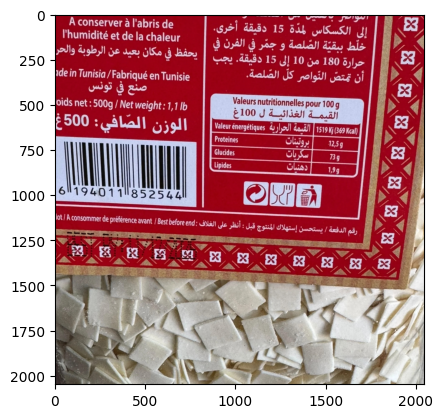


0: 640x640 1 Product, 12.9ms
Speed: 4.2ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


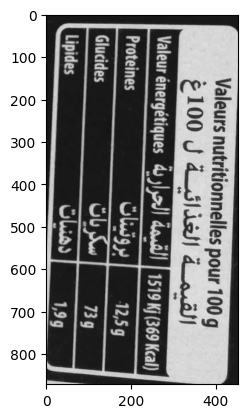

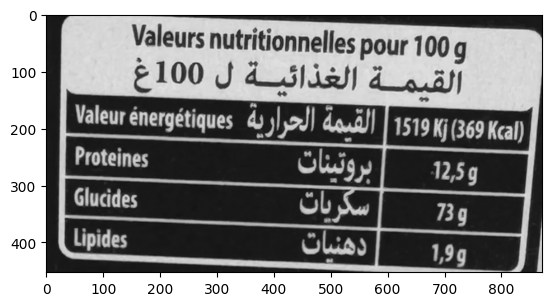

{
  "reference": "pour 100 g",
  "calories": "1519 KJ (369 Kcal)",
  "protein": "12,5 g",
  "carbohydrates": "73 g",
  "fats": "1,9 g"
}
Clean Format (Llama 70B-Instruct) (Overkill for now):
{"calories": 369.0, "proteins": 12.5, "lipids": 1.9, "carbohydrates": 73.0}


'{"calories": 369.0, "proteins": 12.5, "lipids": 1.9, "carbohydrates": 73.0}'

In [ ]:
pipeline3("/content/test.jpg")

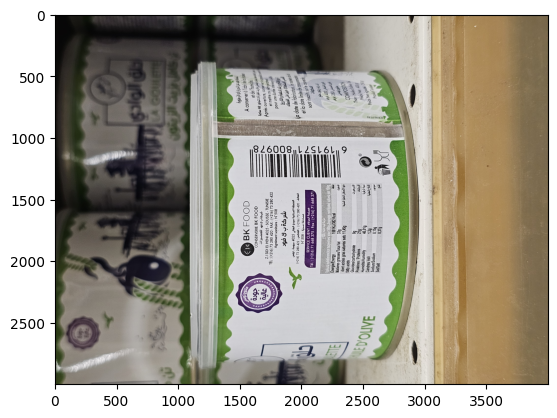


0: 480x640 1 Product, 130.3ms
Speed: 3.8ms preprocess, 130.3ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


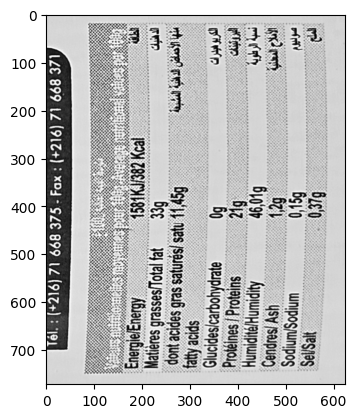

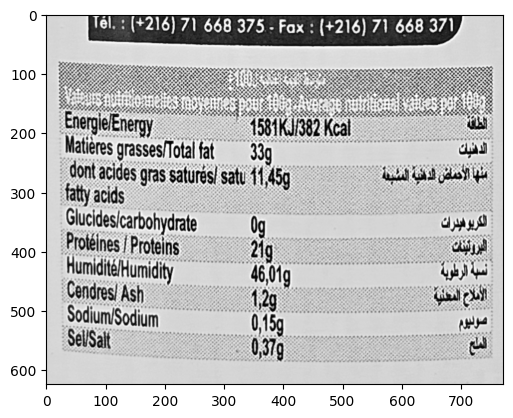

{
  "reference": "pour 100 g",
  "calories": "1581KJ/382 Kcal",
  "protein": "21g",
  "carbohydrates": "0g",
  "fats": "33g"
}
Clean Format (Llama 70B-Instruct) (Overkill for now):
{"calories": 382.0, "proteins": 21.0, "lipids": 33.0, "carbohydrates": 0.0}


'{"calories": 382.0, "proteins": 21.0, "lipids": 33.0, "carbohydrates": 0.0}'

In [ ]:
pipeline3("/content/20251107_202948.jpg")

In [ ]:
pipeline3("/content/TunisianProductsImages/20251107_202802.jpg")


0: 480x640 2 Products, 10.4ms
Speed: 3.4ms preprocess, 10.4ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)
['| Lipides / دهونات | Protéines / البروتينات | Glucides / السكرات | Calcium* / البوتاسيوم |\n|---|---|---|---|\n| 1.5 g | 3 g | 4.5 g | 2010 mg |']


'{"calories": null, "proteins": 3.0, "lipids": 1.5, "carbohydrates": 4.5}'

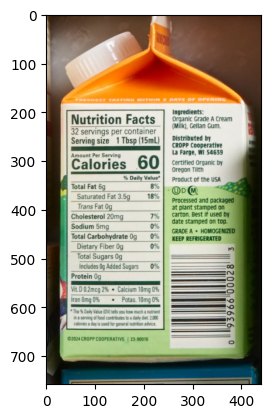


0: 640x384 1 Product, 100.5ms
Speed: 2.8ms preprocess, 100.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 384)


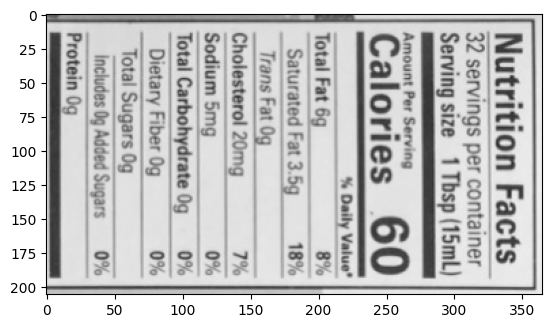

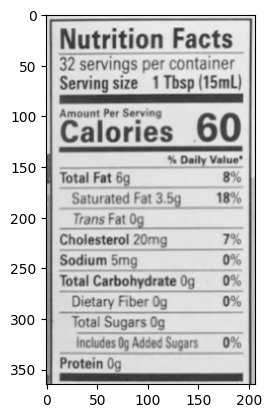

{
  "reference": "per 100g",
  "calories": "60",
  "protein": "0g",
  "carbohydrates": "0g",
  "fats": "6g"
}
Clean Format (Llama 70B-Instruct) (Overkill for now):
{"calories": 60.0, "proteins": 0.0, "lipids": 6.0, "carbohydrates": 0.0}


'{"calories": 60.0, "proteins": 0.0, "lipids": 6.0, "carbohydrates": 0.0}'

In [ ]:
pipeline3("/content/imageimage.jpg")

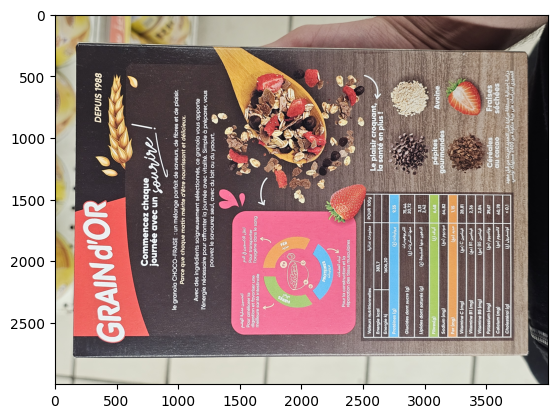


0: 480x640 1 Product, 9.6ms
Speed: 3.1ms preprocess, 9.6ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


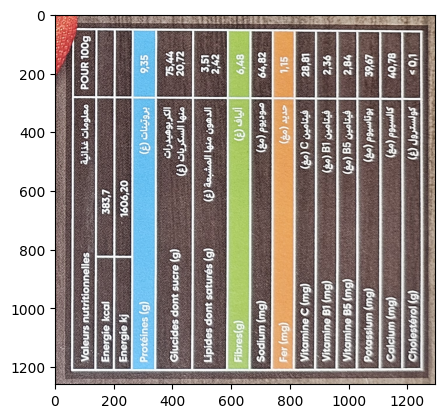

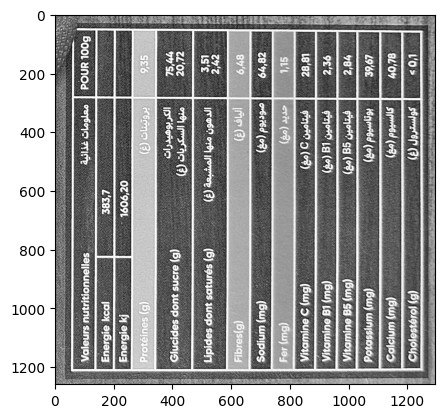

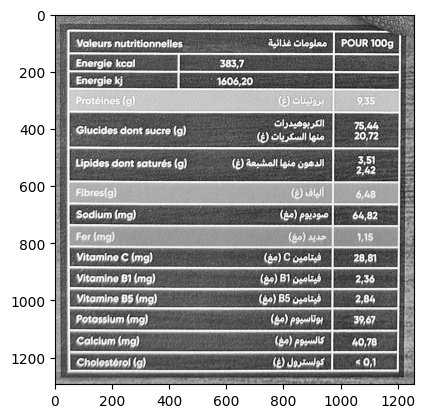

{
  "calories": "383,7 kcal",
  "protein": "9,35 g",
  "carbohydrates": "75,44 g",
  "fats": "3,51 g"
}
Clean Format (Llama 70B-Instruct) (Overkill for now):
{"calories": 383.7, "proteins": 9.35, "lipids": 3.51, "carbohydrates": 75.44}


'{"calories": 383.7, "proteins": 9.35, "lipids": 3.51, "carbohydrates": 75.44}'

In [ ]:
pipeline3("/content/TunisianProductsImages/20251107_201750.jpg")

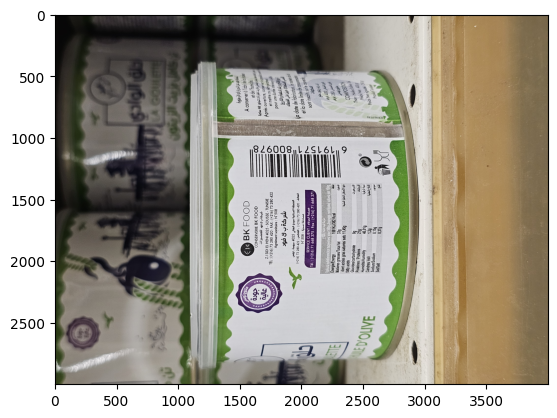


0: 480x640 1 Product, 11.8ms
Speed: 4.7ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


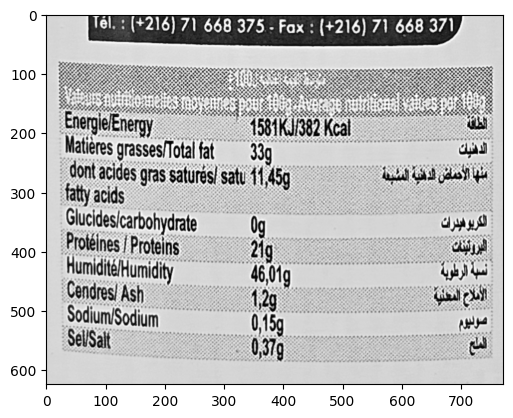

['{\n  "calories": "382",\n  "protein": "21",\n  "carbohydrates": "0",\n  "fats": "33"\n}']
{
  "calories": "382",
  "protein": "21",
  "carbohydrates": "0",
  "fats": "33"
}
Clean Format (Llama 70B-Instruct) (Overkill for now):
{"calories": 382.0, "proteins": 21.0, "lipids": 33.0, "carbohydrates": 0.0}


'{"calories": 382.0, "proteins": 21.0, "lipids": 33.0, "carbohydrates": 0.0}'

In [ ]:
pipeline3("/content/TunisianProductsImages/20251107_202948.jpg")


0: 480x640 1 Product, 11.1ms
Speed: 3.7ms preprocess, 11.1ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


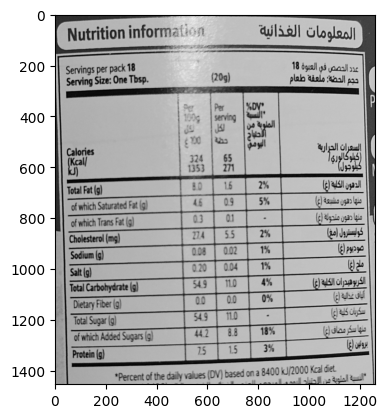

Case : 0
Prediction: {"calories": 324.0, "proteins": 7.5, "lipids": 8.0, "carbohydrates": 54.9}
Truth:  {'calories': 324.0, 'proteins': 7.5, 'lipids': 8.0, 'carbohydrates': 54.9}

0: 480x640 1 Product, 9.2ms
Speed: 2.9ms preprocess, 9.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


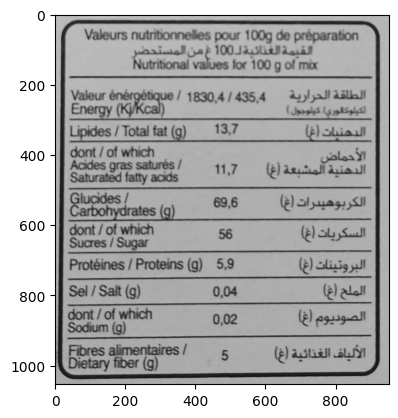

Case : 1
Prediction: {"calories": 435.4, "proteins": 5.9, "lipids": 13.7, "carbohydrates": 69.6}
Truth:  {'calories': 435.4, 'proteins': 5.9, 'lipids': 13.7, 'carbohydrates': 69.6}

0: 480x640 1 Product, 11.9ms
Speed: 3.2ms preprocess, 11.9ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


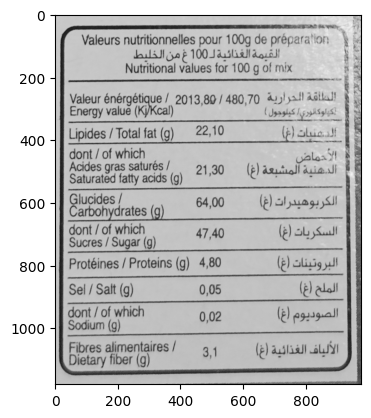

Case : 2
Prediction: {"calories": 483.0, "proteins": 4.8, "lipids": 22.1, "carbohydrates": 64.0}
Truth:  {'calories': 480.7, 'proteins': 4.8, 'lipids': 22.1, 'carbohydrates': 64.0}

0: 480x640 1 Product, 9.5ms
Speed: 3.1ms preprocess, 9.5ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


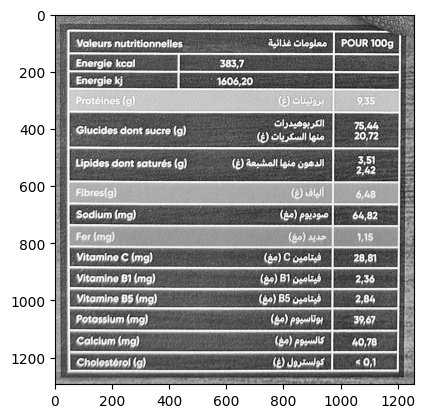

Case : 3
Prediction: {"calories": 383.7, "proteins": 9.35, "lipids": 3.51, "carbohydrates": 75.44}
Truth:  {'calories': 383.7, 'proteins': 9.35, 'lipids': 3.51, 'carbohydrates': 75.44}

0: 480x640 1 Product, 10.5ms
Speed: 3.4ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


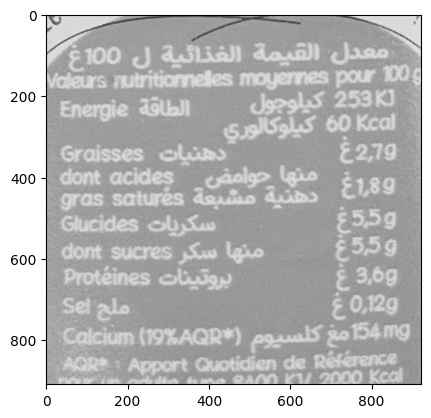

Case : 4
Prediction: {"calories": 60.5, "proteins": 3.6, "lipids": 2.7, "carbohydrates": 5.5}
Truth:  {'calories': 60, 'proteins': 3.6, 'lipids': 2.7, 'carbohydrates': 5.5}

0: 480x640 1 Product, 9.4ms
Speed: 3.0ms preprocess, 9.4ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


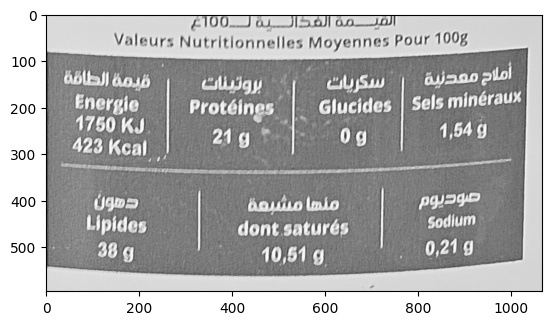

Case : 5
Prediction: {"calories": 418.5, "proteins": 21.0, "lipids": 38.0, "carbohydrates": 0.0}
Truth:  {'calories': 423, 'proteins': 21, 'lipids': 38, 'carbohydrates': 0}

0: 480x640 1 Product, 9.5ms
Speed: 3.0ms preprocess, 9.5ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


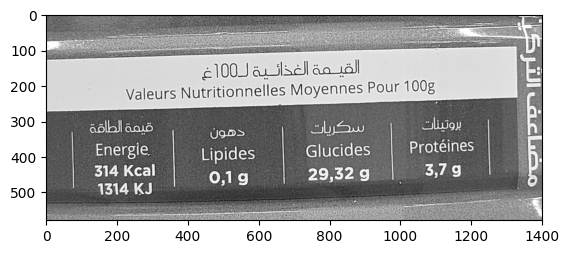

Case : 6
Prediction: {"calories": 314.0, "proteins": 3.7, "lipids": 0.1, "carbohydrates": 29.32}
Truth:  {'calories': 314, 'proteins': 3.7, 'lipids': 0.1, 'carbohydrates': 29.32}

0: 480x640 1 Product, 9.6ms
Speed: 3.3ms preprocess, 9.6ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


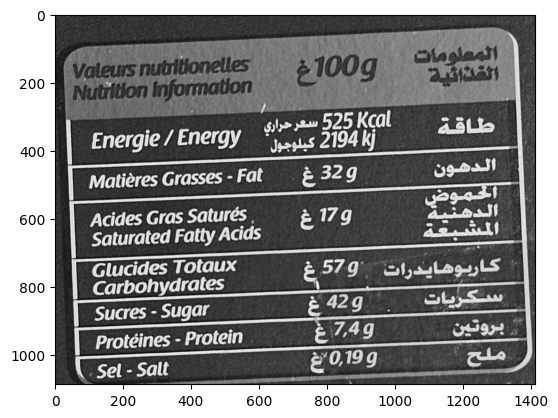

Case : 7
Prediction: {"calories": 525.0, "proteins": 7.4, "lipids": 32.0, "carbohydrates": 57.0}
Truth:  {'calories': 525, 'proteins': 7.4, 'lipids': 32, 'carbohydrates': 57}


In [ ]:
import pandas as pd
import json5

evaluation = pd.read_json("/content/eval_nut/info.json")

keys = ["calories", "proteins", "lipids", "carbohydrates"]


def get_mae(truth, prediction):
  total = 0
  for key in keys:
    if prediction[key] == None:
        total += truth[key]
        continue
    total += abs(truth[key] - prediction[key])
  return total / len(keys)


def evaluate_pipeline():
  mae = 0
  for i in range(len(evaluation)):
    try:
      path = "/content/eval_nut/" + str(evaluation.iloc[i]["image_path"])
      value = pipeline_final(path)
      #truth = json5.loads(str(evaluation.iloc[i]["gt"]))
      #prediction = json5.loads(str(value))
      print("Case :", str(i))
      print("Prediction:", value)
      print("Truth: ", str(evaluation.iloc[i]["gt"]))
      #mae += get_mae(truth, prediction)
      #print(i, mae)
    except Exception as e:
      print("ERROR ERROR ERROR", e)
      # full error
      #mae += 1

  #print("MAE: ", mae/len(evaluation))


evaluate_pipeline()



In [ ]:
!mkdir eval_nut
!mkdir eval_nut/images
!cp "/content/TunisianProductsImages/20251107_201118.jpg" "/content/eval_nut/images/1.jpg"
!cp "/content/TunisianProductsImages/20251107_201223.jpg" "/content/eval_nut/images/3.jpg"
!cp "/content/TunisianProductsImages/20251107_201306.jpg" "/content/eval_nut/images/4.jpg"
!cp "/content/TunisianProductsImages/20251107_201750.jpg" "/content/eval_nut/images/5.jpg"
!cp "/content/TunisianProductsImages/20251107_202413.jpg" "/content/eval_nut/images/6.jpg"
!cp "/content/TunisianProductsImages/20251107_202922.jpg" "/content/eval_nut/images/7.jpg"
!cp "/content/TunisianProductsImages/20251107_203219.jpg" "/content/eval_nut/images/8.jpg"
!cp "/content/TunisianProductsImages/20251107_203438.jpg" "/content/eval_nut/images/9.jpg"

Starting evaluation...


0: 480x640 1 Product, 14.5ms
Speed: 4.0ms preprocess, 14.5ms inference, 2.2ms postprocess per image at shape (1, 3, 480, 640)


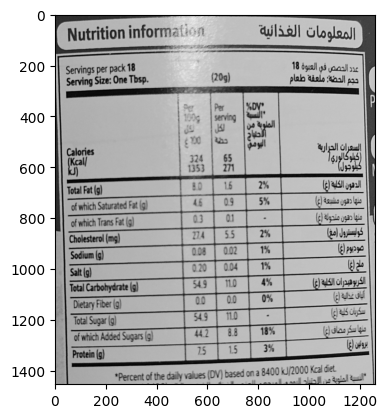

Case 1/8 | Accuracy: 100.0%

0: 480x640 1 Product, 9.5ms
Speed: 3.0ms preprocess, 9.5ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


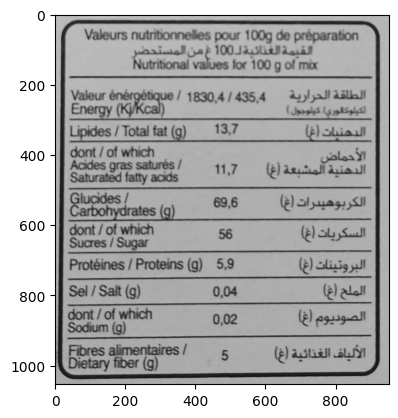

Case 2/8 | Accuracy: 100.0%

0: 480x640 1 Product, 9.6ms
Speed: 3.7ms preprocess, 9.6ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


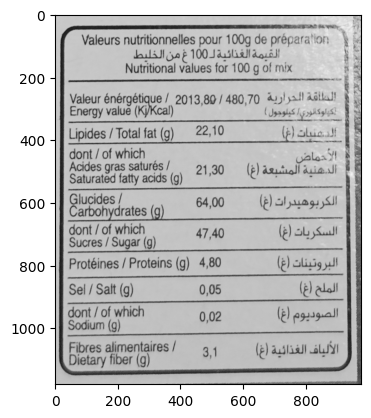

Case 3/8 | Accuracy: 75.0%

0: 480x640 1 Product, 9.8ms
Speed: 3.0ms preprocess, 9.8ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


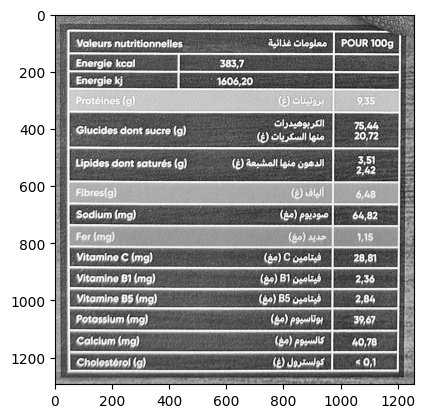

Case 4/8 | Accuracy: 100.0%

0: 480x640 1 Product, 12.7ms
Speed: 3.2ms preprocess, 12.7ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


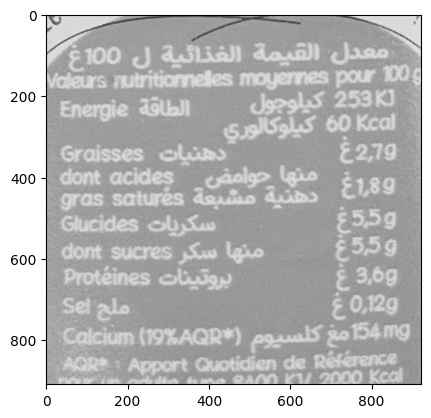

Case 5/8 | Accuracy: 75.0%

0: 480x640 1 Product, 9.3ms
Speed: 3.0ms preprocess, 9.3ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


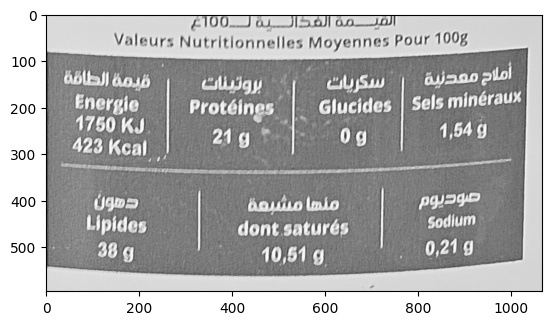

Case 6/8 | Accuracy: 50.0%

0: 480x640 1 Product, 9.2ms
Speed: 2.9ms preprocess, 9.2ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


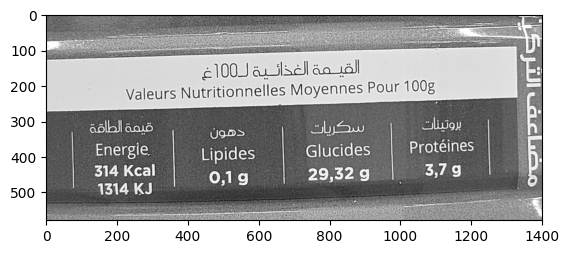

Case 7/8 | Accuracy: 75.0%

0: 480x640 1 Product, 9.3ms
Speed: 3.0ms preprocess, 9.3ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


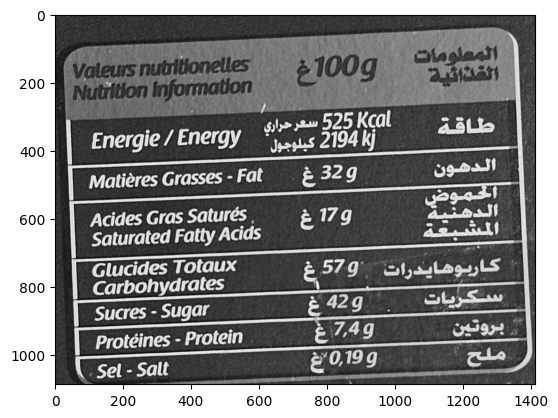

Case 8/8 | Accuracy: 50.0%

FINAL RESULT: Average Accuracy = 78.12%


In [ ]:
import pandas as pd
import json5
from IPython.display import display, Image as IPImage, HTML
import os

# Load evaluation data
evaluation = pd.read_json("/content/eval_nut/info.json")

def normalize_value(val):
    """Helper: normalize strings for comparison (lowercase, strip, handle common units)"""
    if val is None or val == "null" or pd.isna(val):
        return None
    val = str(val).strip().lower()
    # Normalize common variations
    val = val.replace("كالوري", "kcal").replace("جم", "g").replace("غ", "g")
    val = val.replace(",", ".").replace(" ", "")
    return val if val != "" else None

def compute_accuracy(pred, truth):
    """Compute per-field and overall accuracy"""
    if not isinstance(pred, dict) or not isinstance(truth, dict):
        return 0.0, {k: False for k in ["calories", "protein", "carbohydrates", "fats"]}

    fields = ["calories", "protein", "carbohydrates", "fats"]
    correct = 0
    details = {}

    for field in fields:
        p = normalize_value(pred.get(field))
        t = normalize_value(truth.get(field))
        match = (p == t) or (p is None and t is None)
        details[field] = "Yes" if match else "No"
        if match:
            correct += 1

    overall_acc = (correct / len(fields)) * 100
    return overall_acc, details

def evaluate_pipeline():
    results = []

    print("Starting evaluation...\n")
    for i in range(len(evaluation)):
        row = evaluation.iloc[i]
        image_path = "/content/eval_nut/" + str(row["image_path"])
        gt_raw = row["gt"]

        try:
            # Run your pipeline
            prediction_raw = pipeline_final(image_path)

            # Parse JSON strings if needed
            try:
                prediction = json5.loads(prediction_raw) if isinstance(prediction_raw, str) else prediction_raw
                truth = json5.loads(gt_raw) if isinstance(gt_raw, str) else gt_raw
            except:
                prediction = prediction_raw
                truth = gt_raw

            # Compute accuracy
            overall_acc, field_matches = compute_accuracy(prediction, truth)

            # Build result row
            results.append({
                "Image": f'<img src="{image_path}" width="250"/>',
                "Prediction": f'<pre>{json5.dumps(prediction, indent=2)}</pre>',
                "Ground Truth": f'<pre>{json5.dumps(truth, indent=2)}</pre>',
                "Accuracy": f"{overall_acc:.1f}%",
                "Calories": field_matches["calories"],
                "Protein": field_matches["protein"],
                "Carbs": field_matches["carbohydrates"],
                "Fats": field_matches["fats"]
            })

            print(f"Case {i+1}/{len(evaluation)} | Accuracy: {overall_acc:.1f}%")

        except Exception as e:
            print(f"ERROR on case {i}: {e}")
            results.append({
                "Image": f'<img src="{image_path}" width="250"/>',
                "Prediction": f"<span style='color:red'>ERROR: {str(e)[:100]}</span>",
                "Ground Truth": f'<pre>{gt_raw}</pre>',
                "Accuracy": "0.0%",
                "Calories": "No", "Protein": "No", "Carbs": "No", "Fats": "No"
            })

    # Final beautiful table
    df_results = pd.DataFrame(results)
    total_accuracy = df_results["Accuracy"].str.replace("%", "").astype(float).mean()

    print("\n" + "="*80)
    print(f"FINAL RESULT: Average Accuracy = {total_accuracy:.2f}%")
    print("="*80)

    # Display rich HTML table
    styled = df_results.style \
        .set_properties(**{'text-align': 'left', 'vertical-align': 'top'}) \
        .set_table_styles([
            {'selector': 'th', 'props': [('font-size', '12pt'), ('text-align', 'center')]},
            {'selector': 'td', 'props': [('padding', '8px')]},
        ]) \
        .background_gradient(subset=["Accuracy"], cmap="RdYlGn")

    return df_results, styled

# Run it!
res,styl =  evaluate_pipeline()

In [ ]:
df.to_csv("result_ev.csv")

|FIELD1|Image                                                    |Prediction                                                                                 |Ground Truth                                                                               |Accuracy|Calories|Protein|Carbs|Fats|
|------|---------------------------------------------------------|-------------------------------------------------------------------------------------------|-------------------------------------------------------------------------------------------|--------|--------|-------|-----|----|
|0     |<img src="/content/eval_nut/images/1.jpg" width="250"/>|<pre>{   calories: 324.0,   proteins: 7.5,   lipids: 8.0,   carbohydrates: 54.9, }</pre>   |<pre>{   calories: 324.0,   proteins: 7.5,   lipids: 8.0,   carbohydrates: 54.9, }</pre>   |100.0%  |Yes     |Yes    |Yes  |Yes |
|1     |<img src="/content/eval_nut/./images/3.jpg" width="250"/>|<pre>{   calories: 435.4,   proteins: 5.9,   lipids: 13.7,   carbohydrates: 69.6, }</pre>  |<pre>{   calories: 435.4,   proteins: 5.9,   lipids: 13.7,   carbohydrates: 69.6, }</pre>  |100.0%  |Yes     |Yes    |Yes  |Yes |
|2     |<img src="/content/eval_nut/./images/4.jpg" width="250"/>|<pre>{   calories: 483.0,   proteins: 4.8,   lipids: 22.1,   carbohydrates: 64.0, }</pre>  |<pre>{   calories: 480.7,   proteins: 4.8,   lipids: 22.1,   carbohydrates: 64.0, }</pre>  |75.0%   |No      |Yes    |Yes  |Yes |
|3     |<img src="/content/eval_nut/./images/5.jpg" width="250"/>|<pre>{   calories: 383.7,   proteins: 9.35,   lipids: 3.51,   carbohydrates: 75.44, }</pre>|<pre>{   calories: 383.7,   proteins: 9.35,   lipids: 3.51,   carbohydrates: 75.44, }</pre>|100.0%  |Yes     |Yes    |Yes  |Yes |
|4     |<img src="/content/eval_nut/./images/6.jpg" width="250"/>|<pre>{   calories: 60.5,   proteins: 3.6,   lipids: 2.7,   carbohydrates: 5.5, }</pre>     |<pre>{   calories: 60,   proteins: 3.6,   lipids: 2.7,   carbohydrates: 5.5, }</pre>       |75.0%   |No      |Yes    |Yes  |Yes |
|5     |<img src="/content/eval_nut/./images/7.jpg" width="250"/>|<pre>{   calories: 418.5,   proteins: 21.0,   lipids: 38.0,   carbohydrates: 0.0, }</pre>  |<pre>{   calories: 423,   proteins: 21,   lipids: 38,   carbohydrates: 0, }</pre>          |50.0%   |No      |Yes    |No   |Yes |
|6     |<img src="/content/eval_nut/./images/8.jpg" width="250"/>|<pre>{   calories: 314.0,   proteins: 3.7,   lipids: 0.1,   carbohydrates: 29.32, }</pre>  |<pre>{   calories: 314,   proteins: 3.7,   lipids: 0.1,   carbohydrates: 29.32, }</pre>    |75.0%   |No      |Yes    |Yes  |Yes |
|7     |<img src="/content/eval_nut/./images/9.jpg" width="250"/>|<pre>{   calories: 525.0,   proteins: 7.4,   lipids: 32.0,   carbohydrates: 57.0, }</pre>  |<pre>{   calories: 525,   proteins: 7.4,   lipids: 32,   carbohydrates: 57, }</pre>        |50.0%   |No      |Yes    |No   |Yes |


Running numerical evaluation...


0: 480x640 1 Product, 12.1ms
Speed: 3.6ms preprocess, 12.1ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


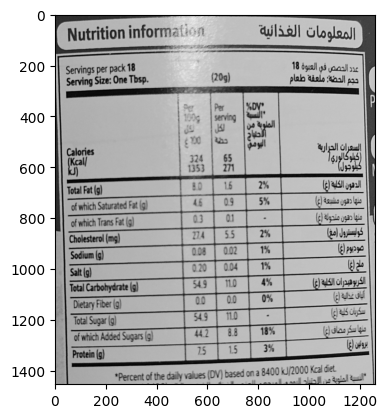

Case  1 → Accuracy: 100.0% | MAE: 0.00

0: 480x640 1 Product, 9.5ms
Speed: 3.6ms preprocess, 9.5ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


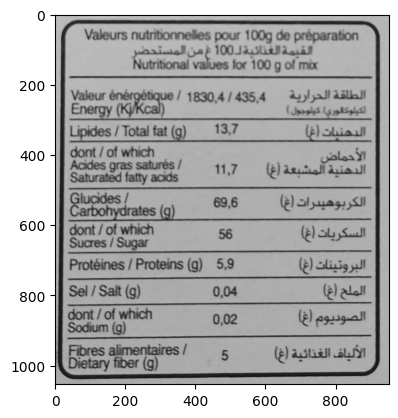

Case  2 → Accuracy: 100.0% | MAE: 0.00

0: 480x640 1 Product, 9.5ms
Speed: 3.1ms preprocess, 9.5ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


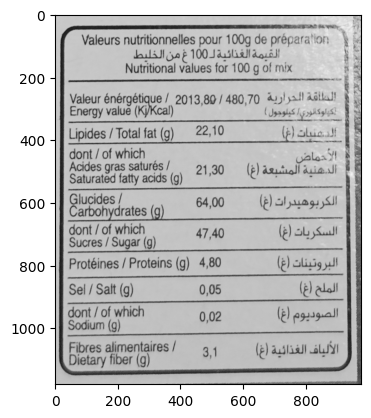

Case  3 → Accuracy: 100.0% | MAE: 0.58

0: 480x640 1 Product, 9.4ms
Speed: 2.9ms preprocess, 9.4ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


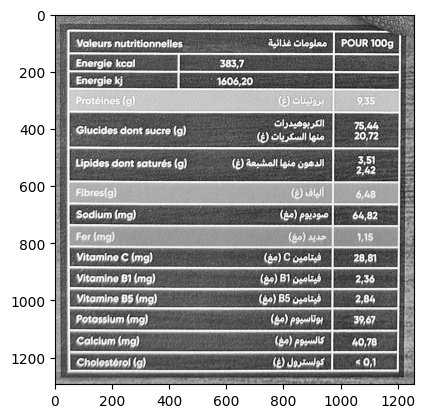

Case  4 → Accuracy: 100.0% | MAE: 0.00

0: 480x640 1 Product, 12.6ms
Speed: 4.1ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


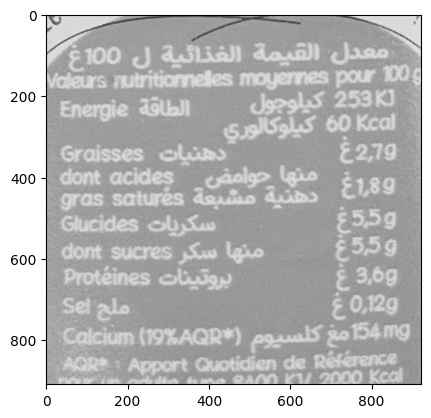

Case  5 → Accuracy:  75.0% | MAE: 0.12

0: 480x640 1 Product, 9.7ms
Speed: 3.0ms preprocess, 9.7ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


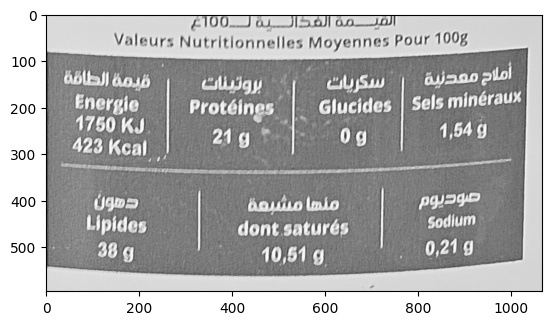

Case  6 → Accuracy:  75.0% | MAE: 1.12

0: 480x640 1 Product, 12.2ms
Speed: 4.1ms preprocess, 12.2ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


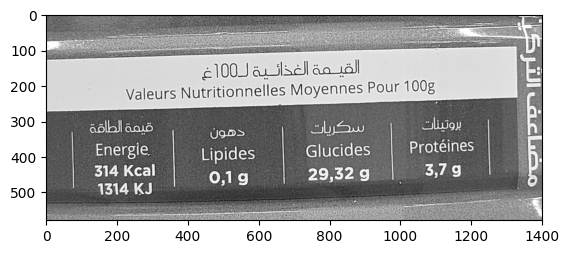

Case  7 → Accuracy: 100.0% | MAE: 0.00

0: 480x640 1 Product, 9.4ms
Speed: 3.1ms preprocess, 9.4ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


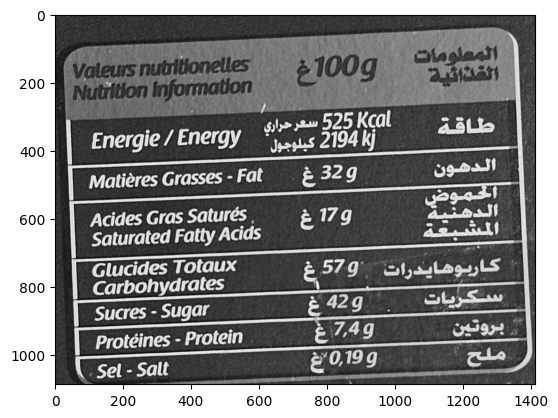

Case  8 → Accuracy: 100.0% | MAE: 0.00

══════════════════════════════════════════════════════════════════════════════════════════
FINAL RESULT → Average Accuracy: 93.75% | Average MAE: 0.228
══════════════════════════════════════════════════════════════════════════════════════════


In [ ]:
import pandas as pd
import json5
import re
from IPython.display import display, HTML
import numpy as np

evaluation = pd.read_json("/content/eval_nut/info.json")

def extract_number(value):
    """Extract float number from strings like '5.3 g', '5,3g', '275 kcal', '0,0g' → returns float or None"""
    if value is None or value == "null" or pd.isna(value):
        return None
    text = str(value).strip()
    if text == "" or text.lower() in ["null", "none", "n/a"]:
        return None
    # Find first sequence of digits, possibly with comma or dot
    match = re.search(r'[-+]?\d*[\.,]?\d+', text.replace(",", "."))  # normalize comma → dot
    return float(match.group()) if match else None

def extract_unit(value):
    """Extract unit like 'g, kcal, etc. (kept for display only)"""
    if value is None or value == "null" or pd.isna(value):
        return None
    text = str(value).strip()
    match = re.search(r'[a-zA-Z%]+', text)
    return match.group() if match else None

def parse_nutrition_dict(raw_dict):
    """Convert raw dict (with string values) → dict with numeric values + units"""
    if not isinstance(raw_dict, dict):
        return {}, {}
    num_dict = {}
    unit_dict = {}
    for key in ["calories", "protein", "carbohydrates", "fats"]:
        val = raw_dict.get(key)
        num_dict[key] = extract_number(val)
        unit_dict[key] = extract_unit(val) or "unknown"
    return num_dict, unit_dict

def compute_numerical_accuracy(pred_num, truth_num):
    """Compare floats only — tolerant to small differences (e.g. 5.0 vs 5)"""
    fields = ["calories", "protein", "carbohydrates", "fats"]
    correct = 0
    mae_total = 0
    details = {}

    for field in fields:
        p = pred_num.get(field)
        t = truth_num.get(field)

        if p is None and t is None:
            correct += 1
            details[field] = "Yes"
        elif p is None or t is None:
            details[field] = "No (missing)"
        else:
            # Use relative tolerance (good for nutrition values)
            if abs(p - t) < 0.01 or (t != 0 and abs(p - t) / t < 0.005):
                correct += 1
                details[field] = "Yes"
            else:
                details[field] = f"No ({p} vs {t})"
            mae_total += abs(p - t)

    accuracy = (correct / len(fields)) * 100
    mae = mae_total / len(fields)
    return accuracy, mae, details

# MAIN EVALUATION
def evaluate_pipeline():
    results = []
    total_mae = 0
    total_acc = 0

    print("Running numerical evaluation...\n")

    for i in range(len(evaluation)):
        row = evaluation.iloc[i]
        image_path = "/content/eval_nut/" + str(row["image_path"])
        gt_raw = row["gt"]

        try:
            # Run your OCR + LLM pipeline
            pred_raw = pipeline_final(image_path)

            # Parse both prediction and ground truth
            pred_dict = json5.loads(pred_raw) if isinstance(pred_raw, str) else pred_raw
            truth_dict = json5.loads(gt_raw) if isinstance(gt_raw, str) else gt_raw

            pred_num, pred_unit = parse_nutrition_dict(pred_dict)
            truth_num, truth_unit = parse_nutrition_dict(truth_dict)

            acc, mae, details = compute_numerical_accuracy(pred_num, truth_num)

            total_mae += mae
            total_acc += acc

            results.append({
                "Image": f'<img src="{image_path}" width="280"/>',
                "Prediction": f'<pre>{json5.dumps(pred_dict, indent=2)}</pre>',
                "Ground Truth": f'<pre>{json5.dumps(truth_dict, indent=2)}</pre>',
                "Accuracy": f"{acc:.1f}%",
                "MAE": f"{mae:.2f}",
                "Calories": details["calories"],
                "Protein": details["protein"],
                "Carbs": details["carbohydrates"],
                "Fats": details["fats"]
            })

            print(f"Case {i+1:2d} → Accuracy: {acc:5.1f}% | MAE: {mae:.2f}")

        except Exception as e:
            print(f"ERROR {i}: {e}")
            results.append({
                "Image": f'<img src="{image_path}" width="280"/>',
                "Prediction": f"<b style='color:red'>CRASHED: {str(e)[:80]}</b>",
                "Ground Truth": f'<pre>{gt_raw}</pre>',
                "Accuracy": "0.0%", "MAE": "-",
                "Calories": "No", "Protein": "No", "Carbs": "No", "Fats": "No"
            })

    # Final report
    avg_acc = total_acc / len(evaluation)
    avg_mae = total_mae / len(evaluation)

    print("\n" + "═" * 90)
    print(f"FINAL RESULT → Average Accuracy: {avg_acc:.2f}% | Average MAE: {avg_mae:.3f}")
    print("═" * 90)

    df = pd.DataFrame(results)
    styled = df.style \
        .set_properties(**{'text-align': 'left', 'vertical-align': 'top'}) \
        .background_gradient(subset=["Accuracy"], cmap="RdYlGn") \
        .background_gradient(subset=["MAE"], cmap="Reds_r")

    return df, styled

# RUN IT
df, styled = evaluate_pipeline()

In [ ]:
df